## Libraries

In [39]:
import torch
import torch.nn as nn
import torchvision.utils as vutils
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import transforms

import sys
sys.path.append('C:/Users/Rowida/Desktop/graduation project/models/text-to-image-using-GAN/text-to-image-using-GAN/new_data_util.py')

from utils import process_caption, weights_init
#from models.char_cnn_rnn_model import CharCNNRNN
from models.dcgan_model import Generator, Discriminator

import os
import time
import imageio
from datetime import datetime
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

    Load Data  

In [40]:
import pandas as pd

# Load CSV file
csv_file = 'C:/Users/Rowida/Desktop/graduation project/New folder/labels2.csv'
df = pd.read_csv(csv_file)

# Print the first few rows of the dataframe
print(df.head())

# Print the dataframe shape
print(f"Dataframe shape: {df.shape}")


       image_filename  image_id  \
0     SceneScene0.png         0   
1     SceneScene1.png         1   
2    SceneScene10.png        10   
3   SceneScene100.png       100   
4  SceneScene1000.png      1000   

                                              labels  
0  , small sun on right corner , points cut top a...  
1  hi, to the left is an angry boy kicking a socc...  
2  , medium ? busy tree right knot hole facing le...  
3  , med boy shocked face , kicking with right le...  
4  , hello . starting on the right . medium bear ...  
Dataframe shape: (9993, 3)


In [41]:
class Text2ImageDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None, file_extension='.png'):
        self.data_frame = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.transform = transform
        self.file_extension = file_extension
        self.le = LabelEncoder()  # Initialize the label encoder

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        img_name = os.path.join(self.image_dir, self.data_frame.iloc[idx, 0])
        print(f"img_name: {img_name}")  # Print img_name for debugging
        
        try:
            start_time = time.time()
            image = Image.open(img_name).convert('RGB')
            load_time = time.time() - start_time
            print(f"Loaded image {img_name} in {load_time:.2f} seconds")
        except FileNotFoundError:
            print(f"Error loading image {img_name}: File not found")
            return None
        
        label = self.data_frame.iloc[idx, 2]
        label_encoded = self.le.fit_transform([label])[0]  # Encode the label
        label_tensor = torch.tensor(label_encoded, dtype=torch.float32)  # Convert the encoded label to a tensor
        
        if self.transform:
            image = self.transform(image)
        
        sample = {'image': image, 'label': label_tensor}
        
        return sample if image is not None else None

In [42]:
import os
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import time
import torchvision.transforms as transforms
from sklearn.preprocessing import LabelEncoder

# Define paths
csv_file = 'C:/Users/Rowida/Desktop/graduation project/New folder/labels2.csv'
image_dir = 'C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes'

# Define transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Create dataset
dataset = Text2ImageDataset(csv_file=csv_file, image_dir=image_dir, transform=transform, file_extension='.png')

# Check the first few entries to verify paths
for i in range(10):
    print(dataset[i])

# Filter out None samples
filtered_dataset = [sample for sample in dataset if sample is not None]
print(f"Filtered dataset length: {len(filtered_dataset)}")

# Ensure filtered dataset is not empty before creating DataLoader
if len(filtered_dataset) > 0:
    # Create data loader with reduced number of workers
    dataloader = DataLoader(filtered_dataset, batch_size=64, shuffle=True, num_workers=0)

    # Example of iterating through the dataloader with progress printing
    for i, data in enumerate(dataloader):
        images, labels = data['image'], data['label']
        print(f'Batch {i+1}')
        print(f'Images shape: {images.shape}')
        print(f'Labels: {labels}')
        break  # Remove this line to iterate through all batches
else:
    print("Filtered dataset is empty. Please check the image paths in the CSV file.")


img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene0.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene0.png in 0.02 seconds
{'image': tensor([[[-0.4667, -0.4667, -0.4667,  ..., -0.3961,  0.5137, -0.0980],
         [-0.4667, -0.4667, -0.4667,  ..., -0.2784,  0.7569,  0.1451],
         [-0.4667, -0.4667, -0.4667,  ..., -0.2627,  0.7961,  0.1922],
         ...,
         [-0.3020, -0.3020, -0.3020,  ..., -0.3020, -0.3020, -0.3020],
         [-0.3020, -0.3020, -0.3020,  ..., -0.3020, -0.3020, -0.3020],
         [-0.3020, -0.3020, -0.3020,  ..., -0.3020, -0.3020, -0.3020]],

        [[ 0.7725,  0.7725,  0.7725,  ...,  0.7176,  0.3725,  0.5765],
         [ 0.7725,  0.7725,  0.7725,  ...,  0.6706,  0.6706,  0.5765],
         [ 0.7725,  0.7725,  0.7725,  ...,  0.7098,  0.8118,  0.6784],
         ...,
         [ 0.2784,  0.2784,  0.2784,  ...,  0.2784,  0.2784,  0.2784],
   

## Setup

In [43]:
# Setting device to cuda
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using Device", device)

Using Device cuda


In [44]:
# saving current date and time
date = datetime.now().strftime('%Y%m%d')
start_time = time.time()

In [45]:
# directory to store output images
output_save_path = './generated_images/'
os.makedirs(output_save_path, exist_ok=True)

In [46]:
# directory to store trained models
import os
model_save_path = './saved_models/'
os.makedirs(model_save_path, exist_ok=True)

In [47]:
# setting up parameters
noise_dim = 100
embed_dim = 1024
embed_out_dim = 128
batch_size = 256 #128
real_label = 1.
fake_label = 0.
learning_rate = 0.0002
l1_coef = 50
l2_coef = 100

num_epochs = 250
log_interval = 18 #43

In [48]:
# Create dataset and data loader
dataset = Text2ImageDataset(csv_file=csv_file, image_dir=image_dir, transform=transform, file_extension='.png')
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [49]:
# Print number of batches
print("No of batches: ", len(train_loader))

No of batches:  40


In [50]:
# Define loss functions
criterion = nn.BCELoss()
l2_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

# Lists to store losses
D_losses = []
G_losses = []

In [51]:
import torch.nn.functional as F

In [105]:
# class Generator(nn.Module):
#     def __init__(self, channels, embed_dim, noise_dim, embed_out_dim):
#         super(Generator, self).__init__()
#         self.fc = nn.Linear(noise_dim + embed_dim, 1024)
#         self.conv_block = nn.Sequential(
#             nn.ConvTranspose2d(1024, 512, 5),
#             nn.ReLU(),
#             nn.ConvTranspose2d(512, 256, 5),
#             nn.ReLU(),
#             nn.ConvTranspose2d(256, 128, 5),
#             nn.ReLU(),
#             nn.ConvTranspose2d(128, channels, 5),
#             nn.Tanh()
#         )

#     def forward(self, noise, embeddings):
#         print("Embeddings shape:", embeddings.shape)
#         print("Noise shape:", noise.shape)
#         embeddings = embeddings.unsqueeze(-1).unsqueeze(-1)  # Add two singleton dimensions
#         x = torch.cat((noise, embeddings), dim=1)  # Concatenate noise and embeddings
#         print("Concatenated shape:", x.shape)
#         x = x.view(x.size(0), -1)  # Flatten the input tensor
#         print("Flattened shape:", x.shape)
#         x = F.relu(self.fc(x))  # Use F.relu here
#         print("After FC shape:", x.shape)
#         x = x.view(x.size(0), 1024, 1, 1)
#         print("Reshaped shape:", x.shape)
#         x = self.conv_block(x)
#         return x

In [102]:
# class Discriminator(nn.Module):
#     def __init__(self, channels, embed_dim, embed_out_dim):
#         super(Discriminator, self).__init__()
#         self.conv_block = nn.Sequential(
#             nn.Conv2d(channels, 128, 4, 2, 1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU(0.2),
#             nn.Conv2d(128, 256, 4, 2, 1),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU(0.2),
#             nn.Conv2d(256, 512, 4, 2, 1),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU(0.2),
#             nn.Conv2d(512, 1024, 4, 2, 1),
#             nn.BatchNorm2d(1024),
#             nn.LeakyReLU(0.2)
#         )
#         self.fc = nn.Linear(1024, 1)  # Modified to accommodate embeddings
#         self.embed_fc = nn.Linear(embed_dim, embed_out_dim)  # Added for embeddings

#     def forward(self, x, embeddings):
#         x = self.conv_block(x)
#         x = x.view(x.size(0), -1)
#         x = self.fc(x)
#         embeddings = self.embed_fc(embeddings)
#         x = torch.cat((x, embeddings), dim=1)  # Concatenate image features and embeddings
#         return x

In [52]:
# Define models
generator = Generator(channels=3, embed_dim=embed_dim, noise_dim=noise_dim, embed_out_dim=embed_out_dim).to(device)
discriminator = Discriminator(channels=3, embed_dim=embed_dim, embed_out_dim=embed_out_dim).to(device)


generator.apply(weights_init)
discriminator.apply(weights_init)

# Define optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

In [53]:
# Training loop
start_time = time.time()
date = datetime.now().strftime('%Y%m%d')

for epoch in range(num_epochs):
    batch_time = time.time()

    for batch_idx, batch in enumerate(train_loader):
        images = batch['image'].to(device)
        
        # Convert label to tensor
        if isinstance(batch['label'], str):
            # Handle string labels appropriately (e.g., tokenization, encoding)
            # For example, if your label is a comma-separated string of numbers:
            try:
                embeddings = torch.tensor([float(x) for x in batch['label'].split(',')], dtype=torch.float32).to(device)
            except ValueError:
                print("Error parsing label:", batch['label'])
                continue  # Skip this batch
        else:
            # Assuming label is already in numeric format
            embeddings = torch.tensor(batch['label'], dtype=torch.float32).to(device)
        
        batch_size = images.size(0)
        
        # Train the discriminator
        optimizer_D.zero_grad()
        
        noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
        fake_images = generator(noise, embeddings)
        
        real_out, real_act = discriminator(images, embeddings)
        d_loss_real = criterion(real_out, torch.full_like(real_out, real_label, device=device))
        
        fake_out, fake_act = discriminator(fake_images.detach(), embeddings)
        d_loss_fake = criterion(fake_out, torch.full_like(fake_out, fake_label, device=device))
        
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()
        
        # Train the generator
        optimizer_G.zero_grad()
        
        noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
        fake_images = generator(noise, embeddings)
        
        out_fake, act_fake = discriminator(fake_images, embeddings)
        out_real, act_real = discriminator(images, embeddings)
        
        g_bce = criterion(out_fake, torch.full_like(out_fake, real_label, device=device))
        g_l1 = l1_coef * l1_loss(fake_images, images)
        g_l2 = l2_coef * l2_loss(torch.mean(act_fake, 0), torch.mean(act_real, 0).detach())
        
        g_loss = g_bce + g_l1 + g_l2
        g_loss.backward()
        optimizer_G.step()
        
        D_losses.append(d_loss.item())
        G_losses.append(g_loss.item())
        
        if (batch_idx + 1) % log_interval == 0 and batch_idx > 0:
            print('Epoch {} [{}/{}] loss_D: {:.4f} loss_G: {:.4f} time: {:.2f}'.format(
                  epoch + 1, batch_idx + 1, len(train_loader),
                  d_loss.mean().item(),
                  g_loss.mean().item(),
                  time.time() - batch_time))
        
        if batch_idx == len(train_loader) - 1 and ((epoch + 1) % 10 == 0 or epoch == 0):
            viz_sample = torch.cat((images[:32], fake_images[:32]), 0)
            vutils.save_image(viz_sample,
                              os.path.join(output_save_path, 'output_{}_epoch_{}.png'.format(date, epoch + 1)),
                              nrow=8, normalize=True)

# Save the trained models
torch.save(generator.state_dict(), os.path.join(model_save_path, 'generator_{}.pth'.format(date)))
torch.save(discriminator.state_dict(), os.path.join(model_save_path, 'discriminator_{}.pth'.format(date)))

print('Total train time: {:.2f}'.format(time.time() - start_time))


img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene1365.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene1365.png in 0.03 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9806.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9806.png in 0.03 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene6151.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene6151.png in 0.04 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9025.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9025.png in 0

RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x256 and 1024x128)

## Training

In [64]:
class Generator(nn.Module):
    def __init__(self, channels=3, embed_dim=embed_dim, noise_dim=noise_dim, embed_out_dim=embed_out_dim):
        super(Generator, self).__init__()

        num_embeddings=10

        # Define the generator architecture here
        self.embed = nn.Embedding(num_embeddings, embed_dim)
        self.embed.weight.data.copy_(torch.from_numpy(embeddings.astype(np.float32)))
        self.embed.weight.requires_grad = False

        self.fc = nn.Linear(embed_dim + noise_dim, 16 * 16 * 256)
        self.conv1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(128)
        self.conv2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.ConvTranspose2d(64, channels, kernel_size=4, stride=2, padding=1, bias=False)
        self.tanh = nn.Tanh()

    def forward(self, noise, embeddings):
        # Define the forward pass through the generator here
        # Use the noise and embeddings as input to generate fake images
        embeddings = self.embed(embeddings)
        embeddings = embeddings.view(-1, embeddings.size(1))
        x = torch.cat((noise, embeddings), dim=1)
        x = self.fc(x)
        x = x.view(-1, 256, 16, 16)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.conv3(x)
        x = self.tanh(x)
        return x

In [65]:
# initializing generator
generator = Generator(channels=3, embed_dim=embed_dim, noise_dim=noise_dim, embed_out_dim=embed_out_dim).to(device)
generator.apply(weights_init)

AttributeError: 'Tensor' object has no attribute 'astype'

In [66]:
# initializing discriminator
discriminator = Discriminator(channels=3, embed_dim=embed_dim, embed_out_dim=embed_out_dim).to(device)
discriminator.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (text_embedding): Embedding(
    (text_embedding): Sequential(
      (0): Linear(in_features=1024, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, mo

In [67]:
# setting up Adam optimizer for Generator and Discriminator
optimizer_G = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

In [68]:
for batch_idx, batch in enumerate(train_loader):
    print(batch.keys())  # Print the keys of the batch
    break

img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene2380.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene2380.png in 0.06 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene4337.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene4337.png in 0.05 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene6255.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene6255.png in 0.02 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9636.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene9636.png in 0

In [70]:
from models.dcgan_model import Generator, Discriminator


In [86]:
import torch
import torch.nn as nn
import torch.optim as optim
import json

# Assuming the Generator and Discriminator classes are defined as provided earlier

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
noise_dim = 100
embed_dim = 1024
embed_out_dim = 128
batch_size = 256 
real_label = 1.
fake_label = 0.
learning_rate = 0.0002
l1_coef = 50
l2_coef = 100
num_epochs = 250
log_interval = 18 
channels = 3  # Assuming RGB images
log_interval = 10  # Adjust as needed


# Initialize models
generator = Generator(channels, noise_dim, embed_dim, embed_out_dim).to(device)
discriminator = Discriminator(channels, embed_dim, embed_out_dim).to(device)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Loss functions
criterion = nn.BCELoss()
l1_loss = nn.L1Loss()
l2_loss = nn.MSELoss()

# Initialize lists to store losses
g_losses = []
d_losses = []

# Training loop
for epoch in range(num_epochs):
    epoch_g_losses = []
    epoch_d_losses = []

    for batch_idx, batch in enumerate(train_loader):
        images = batch['image'].to(device)
        labels = batch['label']

        # Debug print statements
        print(f"Batch {batch_idx}: labels = {labels}")

        try:
            # Assuming labels are strings of comma-separated floats
            embeddings_list = [list(map(float, label.split(','))) for label in labels]
            embeddings = torch.tensor(embeddings_list, dtype=torch.float32).to(device)
        except Exception as e:
            print(f"Skipping batch {batch_idx} due to error: {e}")
            continue

        # Debug print statement
        print(f"Batch {batch_idx}: embeddings shape = {embeddings.shape}")

        images = images.float().to(device)
        batch_size = images.size(0)
        noise = torch.randn(batch_size, noise_dim, 1, 1, dtype=torch.float32).to(device)

        embeddings = embeddings.view(batch_size, -1)

        optimizer_D.zero_grad()

        fake_images = generator(noise, embeddings)

        real_preds, real_feats = discriminator(images, embeddings)
        fake_preds, fake_feats = discriminator(fake_images.detach(), embeddings)

        d_loss_real = criterion(real_preds, torch.ones_like(real_preds).to(device))
        d_loss_fake = criterion(fake_preds, torch.zeros_like(fake_preds).to(device))
        d_loss = d_loss_real + d_loss_fake

        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()

        fake_images = generator(noise, embeddings)

        fake_preds, fake_feats = discriminator(fake_images, embeddings)

        g_loss = criterion(fake_preds, torch.ones_like(fake_preds).to(device))
        g_loss += l1_loss(fake_images, images) * l1_coef
        g_loss += l2_loss(torch.mean(fake_feats), torch.mean(real_feats).detach()) * l2_coef

        g_loss.backward()
        optimizer_G.step()

        # Append losses to lists and print debug statements
        print(f"Batch {batch_idx} G Loss: {g_loss.item():.4f}, D Loss: {d_loss.item():.4f}")
        epoch_g_losses.append(g_loss.item())
        epoch_d_losses.append(d_loss.item())

        if (batch_idx + 1) % log_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], "
                  f"Discriminator Loss: {d_loss.item():.4f}, Generator Loss: {g_loss.item():.4f}")

    # Calculate and print average losses for the epoch
    if epoch_g_losses and epoch_d_losses:
        avg_g_loss = sum(epoch_g_losses) / len(epoch_g_losses)
        avg_d_loss = sum(epoch_d_losses) / len(epoch_d_losses)
        print(f"Epoch [{epoch+1}/{num_epochs}], Average Discriminator Loss: {avg_d_loss:.4f}, Average Generator Loss: {avg_g_loss:.4f}")
        g_losses.append(avg_g_loss)
        d_losses.append(avg_d_loss)
    else:
        print(f"Epoch [{epoch+1}/{num_epochs}] has no valid losses, skipping averaging.")

    # Save models after each epoch
    torch.save(generator.state_dict(), f"generator_epoch_{epoch+1}.pth")
    torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch+1}.pth")

    # Save losses to a file after each epoch
    losses = {
        'g_losses': g_losses,
        'd_losses': d_losses
    }
    with open('losses.json', 'w') as f:
        json.dump(losses, f)

print("Training completed. Final losses saved to 'losses.json'.")



img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene526.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene526.png in 0.03 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene8531.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene8531.png in 0.03 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene2737.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene2737.png in 0.03 seconds
img_name: C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene986.png
Loaded image C:/Users/Rowida/Desktop/graduation project/New folder/generated_scenes/generated_scenes\SceneScene986.png in 0.05 

KeyboardInterrupt: 

In [88]:
print(d_losses)

[]


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import json

# Assuming the Generator and Discriminator classes are defined as provided earlier

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
channels = 3  # Assuming RGB images
embed_dim = 1024
embed_out_dim = 128
noise_dim = 100
num_epochs = 200  # Adjust as needed
log_interval = 10  # Adjust as needed
l1_coef = 0.01  # Adjust as needed
l2_coef = 0.01  # Adjust as needed

# Initialize models
generator = Generator(channels, noise_dim, embed_dim, embed_out_dim).to(device)
discriminator = Discriminator(channels, embed_dim, embed_out_dim).to(device)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Loss functions
criterion = nn.BCELoss()
l1_loss = nn.L1Loss()
l2_loss = nn.MSELoss()

# Initialize lists to store losses
g_losses = []
d_losses = []

# Training loop
for epoch in range(num_epochs):
    epoch_g_losses = []
    epoch_d_losses = []

    for batch_idx, batch in enumerate(train_loader):
        images = batch['image'].to(device)
        labels = batch['label']

        # Debug print statements
        print(f"Batch {batch_idx}: labels = {labels}")

        try:
            # Assuming labels are strings of comma-separated floats
            embeddings_list = [list(map(float, label.split(','))) for label in labels]
            embeddings = torch.tensor(embeddings_list, dtype=torch.float32).to(device)
        except Exception as e:
            print(f"Skipping batch {batch_idx} due to error: {e}")
            continue

        # Debug print statement
        print(f"Batch {batch_idx}: embeddings shape = {embeddings.shape}")

        images = images.float().to(device)
        batch_size = images.size(0)
        noise = torch.randn(batch_size, noise_dim, 1, 1, dtype=torch.float32).to(device)

        embeddings = embeddings.view(batch_size, -1)

        optimizer_D.zero_grad()

        fake_images = generator(noise, embeddings)

        real_preds, real_feats = discriminator(images, embeddings)
        fake_preds, fake_feats = discriminator(fake_images.detach(), embeddings)

        d_loss_real = criterion(real_preds, torch.ones_like(real_preds).to(device))
        d_loss_fake = criterion(fake_preds, torch.zeros_like(fake_preds).to(device))
        d_loss = d_loss_real + d_loss_fake

        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()

        fake_images = generator(noise, embeddings)

        fake_preds, fake_feats = discriminator(fake_images, embeddings)

        g_loss = criterion(fake_preds, torch.ones_like(fake_preds).to(device))
        g_loss += l1_loss(fake_images, images) * l1_coef
        g_loss += l2_loss(torch.mean(fake_feats), torch.mean(real_feats).detach()) * l2_coef

        g_loss.backward()
        optimizer_G.step()

        # Append losses to lists and print debug statements
        print(f"Batch {batch_idx} G Loss: {g_loss.item():.4f}, D Loss: {d_loss.item():.4f}")
        epoch_g_losses.append(g_loss.item())
        epoch_d_losses.append(d_loss.item())

        if (batch_idx + 1) % log_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], "
                  f"Discriminator Loss: {d_loss.item():.4f}, Generator Loss: {g_loss.item():.4f}")

    # Calculate and print average losses for the epoch
    if epoch_g_losses and epoch_d_losses:
        avg_g_loss = sum(epoch_g_losses) / len(epoch_g_losses)
        avg_d_loss = sum(epoch_d_losses) / len(epoch_d_losses)
        print(f"Epoch [{epoch+1}/{num_epochs}], Average Discriminator Loss: {avg_d_loss:.4f}, Average Generator Loss: {avg_g_loss:.4f}")
        g_losses.append(avg_g_loss)
        d_losses.append(avg_d_loss)
    else:
        print(f"Epoch [{epoch+1}/{num_epochs}] has no valid losses, skipping averaging.")

    # Save models after each epoch
    torch.save(generator.state_dict(), f"generator_epoch_{epoch+1}.pth")
    torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch+1}.pth")

    # Save losses to a file after each epoch
    losses = {
        'g_losses': g_losses,
        'd_losses': d_losses
    }
    with open('losses.json', 'w') as f:
        json.dump(losses, f)

print("Training completed. Final losses saved to 'losses.json'.")


In [79]:
print(l2_loss)

MSELoss()


In [8]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import json
# import os


# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# channels = 3  # Assuming RGB images
# embed_dim = 1024
# embed_out_dim = 128
# noise_dim = 100
# num_epochs = 100  # Adjust as needed
# log_interval = 10  # Adjust as needed
# save_interval = 5  # Save losses every 5 epochs (or adjust as needed)
# l1_coef = 0.001  # Adjust as needed
# l2_coef = 0.001  # Adjust as needed

# # Initialize models
# generator = Generator(channels, noise_dim, embed_out_dim).to(device)
# discriminator = Discriminator(channels, embed_dim, embed_out_dim).to(device)

# # Optimizers
# optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
# optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# # Loss functions
# criterion = nn.BCELoss()
# l1_loss = nn.L1Loss()
# l2_loss = nn.MSELoss()

# # Initialize lists to store losses
# g_losses = []
# d_losses = []

# # Function to save losses to a file
# def save_losses(epoch, g_losses, d_losses, file_path='losses.json'):
#     losses = {
#         'epoch': epoch,
#         'g_losses': g_losses,
#         'd_losses': d_losses
#     }
#     with open(file_path, 'w') as f:
#         json.dump(losses, f)
#     print(f"Losses saved at epoch {epoch}")

# # Training loop
# for epoch in range(num_epochs):
#     for batch_idx, batch in enumerate(train_loader):
#         images = batch['image'].to(device)
#         labels = batch['label']

#         # Debug print statements
#         print(f"Batch {batch_idx}: labels = {labels}")

#         try:
#             # Assuming labels are strings of comma-separated floats
#             embeddings_list = [list(map(float, label.split(','))) for label in labels]
#             embeddings = torch.tensor(embeddings_list, dtype=torch.float32).to(device)
#         except Exception as e:
#             print(f"Skipping batch {batch_idx} due to error: {e}")
#             continue

#         # Debug print statement
#         print(f"Batch {batch_idx}: embeddings shape = {embeddings.shape}")

#         images = images.float().to(device)
#         batch_size = images.size(0)
#         noise = torch.randn(batch_size, noise_dim, 1, 1, dtype=torch.float32).to(device)

#         embeddings = embeddings.view(batch_size, -1)

#         optimizer_D.zero_grad()

#         fake_images = generator(noise, embeddings)

#         real_preds, real_feats = discriminator(images, embeddings)
#         fake_preds, fake_feats = discriminator(fake_images.detach(), embeddings)

#         d_loss_real = criterion(real_preds, torch.ones_like(real_preds).to(device))
#         d_loss_fake = criterion(fake_preds, torch.zeros_like(fake_preds).to(device))
#         d_loss = d_loss_real + d_loss_fake

#         d_loss.backward()
#         optimizer_D.step()

#         optimizer_G.zero_grad()

#         fake_images = generator(noise, embeddings)

#         fake_preds, fake_feats = discriminator(fake_images, embeddings)

#         g_loss = criterion(fake_preds, torch.ones_like(fake_preds).to(device))
#         g_loss += l1_loss(fake_images, images) * l1_coef
#         g_loss += l2_loss(torch.mean(fake_feats), torch.mean(real_feats).detach()) * l2_coef

#         g_loss.backward()
#         optimizer_G.step()

#         # Append losses to lists
#         g_losses.append(g_loss.item())
#         d_losses.append(d_loss.item())

#         if (batch_idx + 1) % log_interval == 0:
#             print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], "
#                   f"Discriminator Loss: {d_loss.item():.4f}, Generator Loss: {g_loss.item():.4f}")
#             print(f"Current g_losses length: {len(g_losses)}, Current d_losses length: {len(d_losses)}")

#     # Save the model checkpoints
#     torch.save(generator.state_dict(), f"generator_epoch_{epoch+1}.pth")
#     torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch+1}.pth")

#     # Save the losses at the end of each epoch or at the save_interval
#     if (epoch + 1) % save_interval == 0:
#         save_losses(epoch + 1, g_losses, d_losses)

# # Final save after the training loop ends
# save_losses(num_epochs, g_losses, d_losses)

# # Debug statement to check final loss values
# print(f"Final g_losses length: {len(g_losses)}, Final d_losses length: {len(d_losses)}")


In [7]:
import numpy as np

def load_glove_embeddings(glove_file_path, expected_dim=300):
    glove_embeddings = {}
    with open(glove_file_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            try:
                vector = np.array(values[1:], dtype='float32')
                if vector.shape[0] == expected_dim:
                    glove_embeddings[word] = vector
                else:
                    print(f"Skipping word {word} due to incorrect vector length: {vector.shape[0]}")
            except ValueError:
                print(f"Error processing line: {line}")
    return glove_embeddings

# Path to the GloVe embeddings file
glove_file_path = r'C:\\Users\\Rowida\\Desktop\\graduation project\\models\\text-to-image-using-GAN\\text-to-image-using-GAN\\glove.840B.300d\\glove.840B.300d.txt'
glove_embeddings = load_glove_embeddings(glove_file_path)

# Create a matrix of embeddings
vocab_size = len(glove_embeddings)
embedding_dim = 300  # GloVe 300d
embedding_matrix = np.zeros((vocab_size, embedding_dim))
word_to_idx = {}

for i, (word, vector) in enumerate(glove_embeddings.items()):
    word_to_idx[word] = i
    embedding_matrix[i] = vector


Error processing line: . . . -0.1573 -0.29517 0.30453 -0.54773 0.098293 -0.1776 0.21662 0.19261 -0.21101 0.53788 -0.047755 0.40675 0.023592 -0.32814 0.046858 0.19367 0.25565 -0.021019 -0.15957 -0.1023 0.20303 -0.043333 0.11618 -0.18486 0.0011948 -0.052301 0.34587 0.052335 0.16774 -0.21384 0.055947 0.24934 -0.12179 0.16749 0.28922 -0.033739 0.3015 -0.13241 0.092635 0.37155 -0.2884 -0.0052731 -0.001005 -0.51153 -0.28476 -0.20139 0.11837 -0.0055891 0.43604 0.16796 -0.2701 0.063957 -0.093253 -0.22079 0.36501 0.06545 0.23941 -0.19292 0.098293 0.12172 -0.1168 -0.027436 0.20507 -0.39139 -0.23111 0.46239 0.22888 -0.028415 -0.1798 0.23817 0.28093 -0.47935 0.23177 -0.35587 0.14246 0.11861 0.011018 0.091986 0.0054809 -0.39955 -0.40183 -0.10629 -0.30851 0.12383 -0.16737 -0.43569 0.4211 -0.57416 -0.19964 0.51312 0.090747 -0.21657 0.043519 0.24288 0.081134 0.49104 -0.33342 -0.31056 -0.3136 0.26931 -0.14402 0.33185 -0.21662 -0.072985 0.080603 -0.7266 -0.098385 -0.36233 -0.25346 0.1154 0.25738 0.15802

In [77]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, embedding_matrix, noise_dim=100, output_channels=3):
        super(Generator, self).__init__()
        vocab_size, embed_dim = embedding_matrix.shape
        self.noise_dim = noise_dim
        self.embed_dim = embed_dim
        
        # Define the embedding layer and initialize with the GloVe embeddings
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        
        # Define the layers for the text embedding
        self.text_embedding = nn.Linear(embed_dim, 1024)
        self.text_upsample = nn.Sequential(
            nn.Linear(1024, 128 * 4 * 4),
            nn.BatchNorm1d(128 * 4 * 4),
            nn.ReLU(True)
        )
        
        # Define the layers for the generator
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_dim + 128, 128, 4, 1, 0, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, output_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, noise, text):
        text_embedding = self.embedding(text)
        text_embedding = self.text_embedding(text_embedding)
        text_embedding = self.text_upsample(text_embedding).view(-1, 128, 4, 4)
        z = torch.cat([noise, text_embedding], 1)
        return self.main(z)


In [8]:
from models.dcgan_model import Generator,Embedding

In [9]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#channels = 3  # Assuming RGB images
#embed_dim = 1024
#embed_out_dim = 128
#noise_dim = 100
#num_epochs = 100  # Adjust as needed
#log_interval = 10  # Adjust as needed
#l1_coef = 0.001  # Adjust as needed
#l2_coef = 0.001  # Adjust as needed
noise_dim = 100
embed_dim = 1024
embed_out_dim = 128
batch_size = 256 
real_label = 1.
fake_label = 0.
learning_rate = 0.0002
l1_coef = 50
l2_coef = 100
num_epochs = 250
log_interval = 18 
channels = 3  # Assuming RGB images
log_interval = 10  # Adjust as needed
# Load the model checkpoint
checkpoint_path = 'generator_epoch_250.pth'
# Initialize the generator with the pre-trained GloVe embeddings
generator = Generator(channels=channels, noise_dim=noise_dim, embed_dim=embed_dim, embed_out_dim=embed_out_dim)
#generator.load_state_dict(torch.load(checkpoint_path, map_location=device))
generator.to(device)
generator.eval()


Generator(
  (text_embedding): Sequential(
    (0): Linear(in_features=1024, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(228, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=Fa

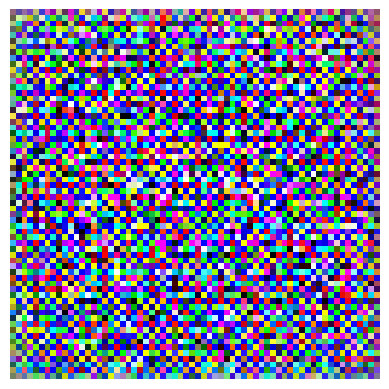

In [10]:
import matplotlib.pyplot as plt

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    return generated_image

# Example text to generate an image
example_text = "medium bear . faces right large bushy trees  bear is under tree that 's a medium bushy tree . sorry . and the bear 's paw is off the right side of pic ., medium girl , crossed legged . , smiling , waving . crown on head . faces left . same level as tree . middle of pic ., medium boy . sitting , legs out , sad , eyes at horizon . faces right . his left foot almost touches girl 's hand ., top left corner . medium cloud . cut off on top and left side ., bear 's paw should be hidden by green of tree . girl and boy 's eyes should be at horizon . gon na peek, shrink the bear . the bear should be snugly fit between the trunk of the tree and the right edge of the picture ., the tree , the bear , the boy and girl should all be about the same level going across the picture ."

# Generate the image
generated_image = generate_image_from_text(example_text, generator, device, word_to_idx)

# Display the image
plt.imshow(generated_image)
plt.axis('off')
plt.show()


In [16]:
!pip install torch torchvision scipy


c:\Users\Rowida\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


FID Score: 3243.1138


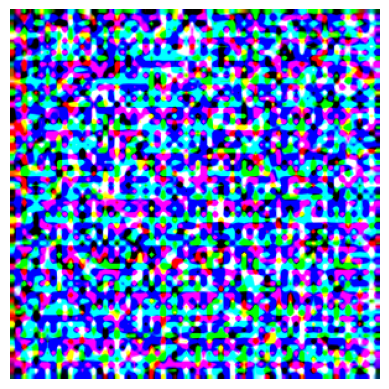

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
import json
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from torchvision.models import inception_v3
from torch.utils.data import DataLoader, Dataset
from scipy.linalg import sqrtm
import matplotlib.pyplot as plt
import os

# Assuming you have your Generator and Discriminator classes defined somewhere

class RealImageDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.image_files = os.listdir(image_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define the real image dataset and data loader
real_image_dir = r'C:\Users\Rowida\Desktop\graduation project\New folder\generated_scenes\generated_scenes'  # Specify the path to your real images directory
real_image_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
real_image_dataset = RealImageDataset(real_image_dir, transform=real_image_transform)
real_image_loader = DataLoader(real_image_dataset, batch_size=32, shuffle=True)

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    generated_image = (generated_image * 255).astype(np.uint8)  # Convert to uint8
    generated_image = Image.fromarray(generated_image)  # Convert to PIL image
    return generated_image

# Function to calculate FID score
def calculate_fid(real_features, generated_features):
    mu_real = np.mean(real_features, axis=0)
    sigma_real = np.cov(real_features, rowvar=False)
    
    mu_generated = np.mean(generated_features, axis=0)
    sigma_generated = np.cov(generated_features, rowvar=False)
    
    ssdiff = np.sum((mu_real - mu_generated) ** 2.0)
    covmean = sqrtm(sigma_real.dot(sigma_generated))
    
    if np.iscomplexobj(covmean):
        covmean = covmean.real
        
    fid = ssdiff + np.trace(sigma_real + sigma_generated - 2.0 * covmean)
    return fid

# Load inception model
inception = inception_v3(pretrained=True, transform_input=False).to(device)
inception.eval()

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Extract features using Inception model
def get_inception_features(images, model, device):
    with torch.no_grad():
        images = images.to(device)
        features = model(images)
    return features.cpu().numpy()

# Generate a batch of images from text descriptions
def generate_images(generator, device, word_to_idx, descriptions, noise_dim=100):
    images = []
    for description in descriptions:
        generated_image = generate_image_from_text(description, generator, device, word_to_idx, noise_dim)
        images.append(transform(generated_image).unsqueeze(0))
    return torch.cat(images)

# Example text to generate an image
example_text = "medium bear . faces right large bushy trees  bear is under tree that 's a medium bushy tree . sorry . and the bear 's paw is off the right side of pic ., medium girl , crossed legged . , smiling , waving . crown on head . faces left . same level as tree . middle of pic ., medium boy . sitting , legs out , sad , eyes at horizon . faces right . his left foot almost touches girl 's hand ., top left corner . medium cloud . cut off on top and left side ., bear 's paw should be hidden by green of tree . girl and boy 's eyes should be at horizon . gon na peek, shrink the bear . the bear should be snugly fit between the trunk of the tree and the right edge of the picture ., the tree , the bear , the boy and girl should all be about the same level going across the picture ."

# List of example text descriptions
example_descriptions = [
    example_text
]

# Generate images
generated_images = generate_images(generator, device, word_to_idx, example_descriptions)

# Calculate features for real and generated images
real_features = []
generated_features = []

# Iterate over real images
for real_images in real_image_loader:
    real_features.append(get_inception_features(real_images, inception, device))

# Iterate over generated images
generated_features.append(get_inception_features(generated_images, inception, device))

# Convert features to numpy arrays
real_features = np.concatenate(real_features)
generated_features = np.concatenate(generated_features)

# Calculate FID
fid_score = calculate_fid(real_features, generated_features)
print(f"FID Score: {fid_score:.4f}")

# Display the generated image
plt.imshow(generated_images[0].permute(1, 2, 0).cpu().numpy())
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.247899..1.9254032].


FID Score: 2882.5359


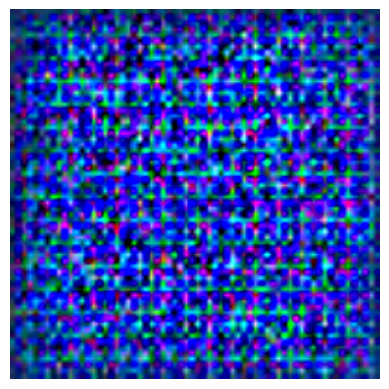

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
import json
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from torchvision.models import inception_v3
from torch.utils.data import DataLoader, Dataset
from scipy.linalg import sqrtm
import matplotlib.pyplot as plt
import os

class RealImageDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.image_files = os.listdir(image_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define the real image dataset and data loader
real_image_dir = r'C:\Users\Rowida\Desktop\graduation project\New folder\generated_scenes\generated_scenes'  # Specify the path to your real images directory
real_image_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
real_image_dataset = RealImageDataset(real_image_dir, transform=real_image_transform)
real_image_loader = DataLoader(real_image_dataset, batch_size=32, shuffle=True)

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    generated_image = np.clip(generated_image, 0, 1)  # Ensure values are in [0, 1]
    generated_image = (generated_image * 255).astype(np.uint8)  # Convert to uint8
    generated_image = Image.fromarray(generated_image)  # Convert to PIL image
    return generated_image

def calculate_fid(real_features, generated_features):
    mu_real = np.mean(real_features, axis=0)
    sigma_real = np.cov(real_features, rowvar=False)
    
    mu_generated = np.mean(generated_features, axis=0)
    sigma_generated = np.cov(generated_features, rowvar=False)
    
    ssdiff = np.sum((mu_real - mu_generated) ** 2.0)
    covmean = sqrtm(sigma_real.dot(sigma_generated))
    
    if np.iscomplexobj(covmean):
        covmean = covmean.real
        
    fid = ssdiff + np.trace(sigma_real + sigma_generated - 2.0 * covmean)
    return fid

# Load inception model
inception = inception_v3(pretrained=True, transform_input=False).to(device)
inception.eval()

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def get_inception_features(images, model, device):
    with torch.no_grad():
        images = images.to(device)
        features = model(images)
    return features.cpu().numpy()

def generate_images(generator, device, word_to_idx, descriptions, noise_dim=100):
    images = []
    for description in descriptions:
        generated_image = generate_image_from_text(description, generator, device, word_to_idx, noise_dim)
        images.append(transform(generated_image).unsqueeze(0))
    return torch.cat(images)

example_text = "mad boy kicking a soccer ball and facing left"

example_descriptions = [
    example_text
]

generated_images = generate_images(generator, device, word_to_idx, example_descriptions)

real_features = []
generated_features = []

for real_images in real_image_loader:
    real_features.append(get_inception_features(real_images, inception, device))

generated_features.append(get_inception_features(generated_images, inception, device))

real_features = np.concatenate(real_features)
generated_features = np.concatenate(generated_features)

fid_score = calculate_fid(real_features, generated_features)
print(f"FID Score: {fid_score:.4f}")

plt.imshow(generated_images[0].permute(1, 2, 0).cpu().numpy())
plt.axis('off')
plt.show()


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
import json
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from torchvision.models import inception_v3
from torch.utils.data import DataLoader, Dataset
from scipy.linalg import sqrtm
import matplotlib.pyplot as plt
import os

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    generated_image = np.clip(generated_image, 0, 1)  # Ensure values are in [0, 1]
    generated_image = (generated_image * 255).astype(np.uint8)  # Convert to uint8
    generated_image = Image.fromarray(generated_image)  # Convert to PIL image
    return generated_image

def calculate_fid(real_features, generated_features):
    mu_real = np.mean(real_features, axis=0)
    sigma_real = np.cov(real_features, rowvar=False)
    
    mu_generated = np.mean(generated_features, axis=0)
    sigma_generated = np.cov(generated_features, rowvar=False)
    
    ssdiff = np.sum((mu_real - mu_generated) ** 2.0)
    covmean = sqrtm(sigma_real.dot(sigma_generated))
    
    if np.iscomplexobj(covmean):
        covmean = covmean.real
        
    fid = ssdiff + np.trace(sigma_real + sigma_generated - 2.0 * covmean)
    return fid

# Load inception model
inception = inception_v3(pretrained=True, transform_input=False).to(device)
inception.eval()

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def get_inception_features(images, model, device):
    with torch.no_grad():
        images = images.to(device)
        features = model(images)
    return features.cpu().numpy()

def generate_images(generator, device, word_to_idx, descriptions, noise_dim=100):
    images = []
    for description in descriptions:
        generated_image = generate_image_from_text(description, generator, device, word_to_idx, noise_dim)
        images.append(transform(generated_image).unsqueeze(0))
    return torch.cat(images)

example_text = "small sun on right corner , points cut top and side ., mad boy kicking a soccer ball and facing left . hip is at horizon and ball mostly above horizon ., behind boy , one finger apart , surprised girl , running to left . she is same level than boy , both kids are big . boy wear sunglasses ., the girl wears colorful hat ., boy is on the left and girl behind boy , bod kids are centered"

example_descriptions = [
    example_text
]

generated_images = generate_images(generator, device, word_to_idx, example_descriptions)

real_features = []
generated_features = []

for real_images in real_image_loader:
    real_features.append(get_inception_features(real_images, inception, device))

generated_features.append(get_inception_features(generated_images, inception, device))

real_features = np.concatenate(real_features)
generated_features = np.concatenate(generated_features)

fid_score = calculate_fid(real_features, generated_features)
print(f"FID Score: {fid_score:.4f}")

plt.imshow(generated_images[0].permute(1, 2, 0).cpu().numpy())
plt.axis('off')
plt.show()


c:\Users\Rowida\anaconda3\envs\myenv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Rowida\anaconda3\envs\myenv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


NameError: name 'real_image_loader' is not defined

In [5]:
import os
os.system('pip install git+https://github.com/openai/CLIP.git')


1

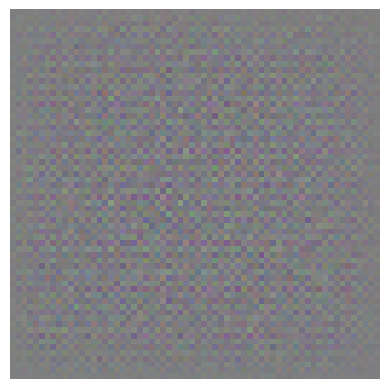

c:\Users\Rowida\anaconda3\envs\myenv\lib\site-packages\torch\nn\functional.py:5504: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)


CLIP Score: 0.2352


In [13]:
import torch
import clip
from PIL import Image
import matplotlib.pyplot as plt

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    return generated_image

# Example text to generate an image
example_text = "small sun on right corner "

# Generate the image
generated_image = generate_image_from_text(example_text, generator, device, word_to_idx)

# Display the image
plt.imshow(generated_image)
plt.axis('off')
plt.show()

# Save the generated image to a file
generated_image_pil = Image.fromarray((generated_image * 255).astype('uint8'))
generated_image_pil.save("generated_image.png")

# Load the CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

# Preprocess the image and text for CLIP
image_input = preprocess(Image.open("generated_image.png")).unsqueeze(0).to(device)
text_input = clip.tokenize([example_text]).to(device)

# Calculate the image and text features
with torch.no_grad():
    image_features = model.encode_image(image_input)
    text_features = model.encode_text(text_input)

# Normalize the features
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)

# Compute the similarity between image and text features
similarity = (image_features @ text_features.T).item()

print(f"CLIP Score: {similarity:.4f}")


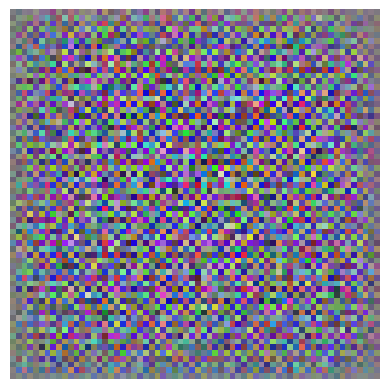

CLIP Score: 0.2043


In [16]:
import torch
import clip
from PIL import Image
import matplotlib.pyplot as plt

def preprocess_text(text, word_to_idx, max_length=1024):
    tokens = text.lower().split()
    indices = [word_to_idx.get(token, 0) for token in tokens]
    if len(indices) < max_length:
        indices += [0] * (max_length - len(indices))
    return torch.tensor(indices[:max_length], dtype=torch.long).unsqueeze(0)

def generate_image_from_text(text, generator, device, word_to_idx, noise_dim=100):
    text_indices = preprocess_text(text, word_to_idx).to(device)
    noise = torch.randn(1, noise_dim, 1, 1, device=device)
    
    # Convert text indices to float32
    text_indices = text_indices.float()

    with torch.no_grad():
        generated_image = generator(noise, text_indices)
    
    generated_image = generated_image.squeeze().cpu().numpy().transpose(1, 2, 0)
    generated_image = (generated_image + 1) / 2  # Rescale to [0, 1]
    return generated_image

# Example text to generate an image
example_text = " the left is an angry boy kicking a soccer ball into the air . a surprised girl is looking at him, in front of the boy is a small pine tree with an owl in it ., there is a small sun in the upper right corner, that 's it thank you"

# Generate the image
generated_image = generate_image_from_text(example_text, generator, device, word_to_idx)

# Display the image
plt.imshow(generated_image)
plt.axis('off')
plt.show()

# Save the generated image to a file
generated_image_pil = Image.fromarray((generated_image * 255).astype('uint8'))
generated_image_pil.save("generated_image.png")

# Load the CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

# Preprocess the image and text for CLIP
image_input = preprocess(Image.open("generated_image.png")).unsqueeze(0).to(device)
text_input = clip.tokenize([example_text]).to(device)

# Calculate the image and text features
with torch.no_grad():
    image_features = model.encode_image(image_input)
    text_features = model.encode_text(text_input)

# Normalize the features
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)

# Compute the similarity between image and text features
similarity = (image_features @ text_features.T).item()

print(f"CLIP Score: {similarity:.4f}")


In [1]:
!pip install git+https://github.com/openai/CLIP.git


  Cloning https://github.com/openai/CLIP.git to c:\users\rowida\appdata\local\temp\4\pip-req-build-c7j8g1ob
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     --------- ------------------------------ 10.2/42.0 kB ? eta -:--:--
     --------- ------------------------------ 10.2/42.0 kB ? eta -:--:--
     --------- ------------------------------ 10.2/42.0 kB ? eta -:--:--
     --------- ------------------------------ 10.2/42.0 kB ? eta -:--:--
     ------------------- ------------------- 20.5/42.0 kB 73.1 kB/s eta 0:00:01
     --------------------------- 

  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\Rowida\AppData\Local\Temp\4\pip-req-build-c7j8g1ob'


In [60]:
class Generator(nn.Module):
    def __init__(self, channels=3, embed_dim=300, noise_dim=100, embed_out_dim=128):
        super(Generator, self).__init__()

        num_embeddings = 10

        # Assuming you have loaded the GloVe embeddings into `embeddings`
        self.embed = nn.Embedding(num_embeddings, embed_dim)
        self.embed.weight.data.copy_(torch.from_numpy(embeddings.astype(np.float32)))
        self.embed.weight.requires_grad = False

        self.fc = nn.Linear(embed_dim + noise_dim, 16 * 16 * 256)
        self.conv1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(128)
        self.conv2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.ConvTranspose2d(64, channels, kernel_size=4, stride=2, padding=1, bias=False)
        self.tanh = nn.Tanh()

    def forward(self, noise, embeddings):
        embeddings = self.embed(embeddings)
        embeddings = embeddings.view(-1, embeddings.size(1))
        x = torch.cat((noise, embeddings), dim=1)
        x = self.fc(x)
        x = x.view(-1, 256, 16, 16)
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.tanh(self.conv3(x))
        return x

In [70]:
!pip install keras


  Using cached keras-3.3.3-py3-none-any.whl.metadata (5.7 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached namex-0.0.8-py3-none-any.whl.metadata (246 bytes)
     ---------------------------------------- 0.0/46.2 kB ? eta -:--:--
     -------- ------------------------------- 10.2/46.2 kB ? eta -:--:--
     ---------------- --------------------- 20.5/46.2 kB 217.9 kB/s eta 0:00:01
     --------------------------------- ---- 41.0/46.2 kB 330.3 kB/s eta 0:00:01
     --------------------------------- ---- 41.0/46.2 kB 330.3 kB/s eta 0:00:01
     --------------------------------- ---- 41.0/46.2 kB 330.3 kB/s eta 0:00:01
     -------------------------------------- 46.2/46.2 kB 177.2 kB/s eta 0:00:00
Using cached keras-3.3.3-py3-none-any.whl (1.1 MB)
Using cached absl_py-2.1.0-py3-none-any.whl (133 kB)
   ---------------------------------------- 0.0/126.7 kB ? eta -:--:--
   ------------ --------------------------- 41.0/126.7 kB 1.9 MB/s eta 0:00:01
   -------

In [74]:
!pip install tensorflow


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
metricflow-lite 0.130.2 requires MarkupSafe==2.0.1, but you have markupsafe 2.1.5 which is incompatible.


   ---------------------------------------- 0.0/376.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/376.9 MB 640.0 kB/s eta 0:09:49
   ---------------------------------------- 0.1/376.9 MB 1.1 MB/s eta 0:05:59
   ---------------------------------------- 0.1/376.9 MB 1.3 MB/s eta 0:04:48
   ---------------------------------------- 0.3/376.9 MB 1.8 MB/s eta 0:03:34
   ---------------------------------------- 0.4/376.9 MB 2.2 MB/s eta 0:02:53
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta 0:02:46
   ---------------------------------------- 0.5/376.9 MB 2.3 MB/s eta

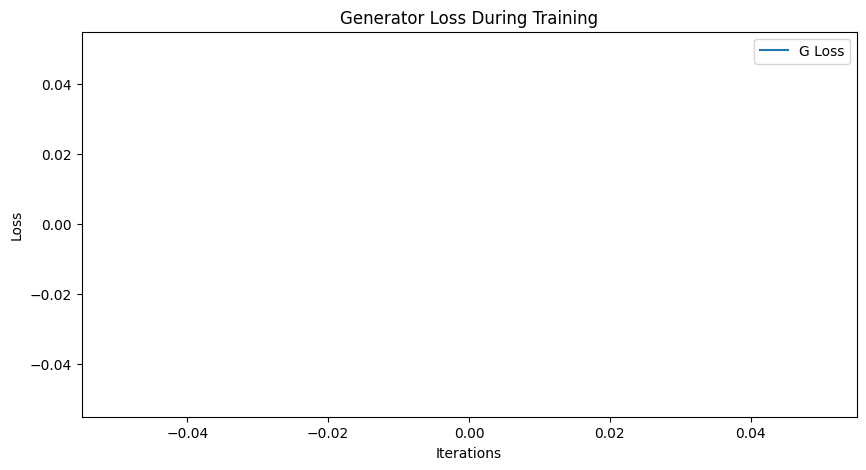

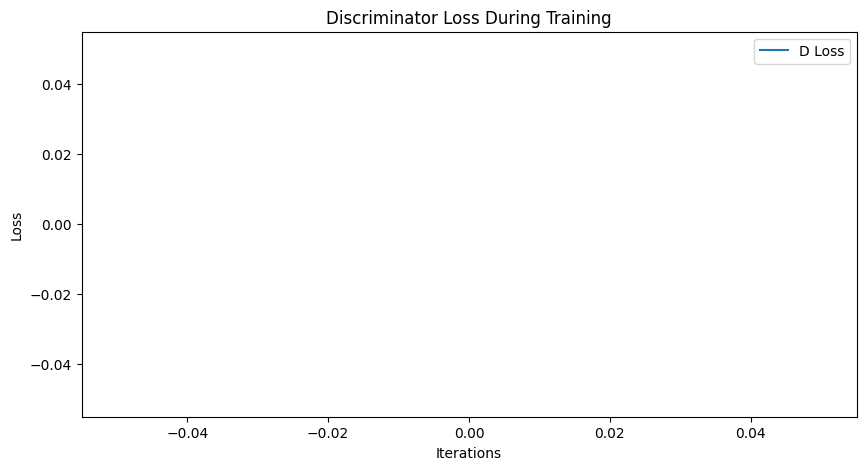

In [168]:
import matplotlib.pyplot as plt
import json
import os
from datetime import datetime

# Load losses from the JSON file
with open('losses.json', 'r') as f:
    losses = json.load(f)

g_losses = losses['g_losses']
d_losses = losses['d_losses']

# Create output directory if it doesn't exist
output_save_path = r'C:\Users\Rowida\Desktop\graduation project\models\text-to-image-using-GAN\text-to-image-using-GAN\generated_images'  # Replace with your desired path
os.makedirs(output_save_path, exist_ok=True)

# Generate current date and time for unique filename
date = datetime.now().strftime("%Y%m%d_%H%M%S")

# Plot Generator Loss
plt.figure(figsize=(10, 5))
plt.title("Generator Loss During Training")
plt.plot(g_losses, label='G Loss')
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.savefig(os.path.join(output_save_path, f'output_generatorLoss_{date}.png'))
plt.show()

# Plot Discriminator Loss
plt.figure(figsize=(10, 5))
plt.title("Discriminator Loss During Training")
plt.plot(d_losses, label='D Loss')
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.savefig(os.path.join(output_save_path, f'output_discriminatorLoss_{date}.png'))
plt.show()


In [183]:
import torch
import torch.nn as nn
from torchvision.utils import save_image

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the generator
generator = Generator(channels=3).to(device)

# Load the trained generator weights
checkpoint_path = "generator_epoch_100.pth"
checkpoint = torch.load(checkpoint_path, map_location=device)
generator.load_state_dict(checkpoint)

# Load GloVe embeddings from the text file
glove_path = "glove.840B.300d.txt"
glove_embeddings = {}
with open(glove_path, 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = torch.tensor([float(val) for val in values[1:]], dtype=torch.float)
        glove_embeddings[word] = vector

# Define the text input
text_input = "A girl with a hat"

# Convert text input to numerical representation using GloVe embeddings
text_embedding = torch.mean(torch.stack([glove_embeddings[word] for word in text_input.split()]), dim=0).unsqueeze(0).to(device)

# Generate noise
noise = torch.randn(1, generator.noise_dim, 1, 1).to(device)

# Generate image from text
generated_image = generator(noise, text_embedding)

# Save or display generated image
output_path = "generated_image.png"
save_image(generated_image, output_path)
print("Image saved at:", output_path)


AttributeError: 'Tensor' object has no attribute 'astype'

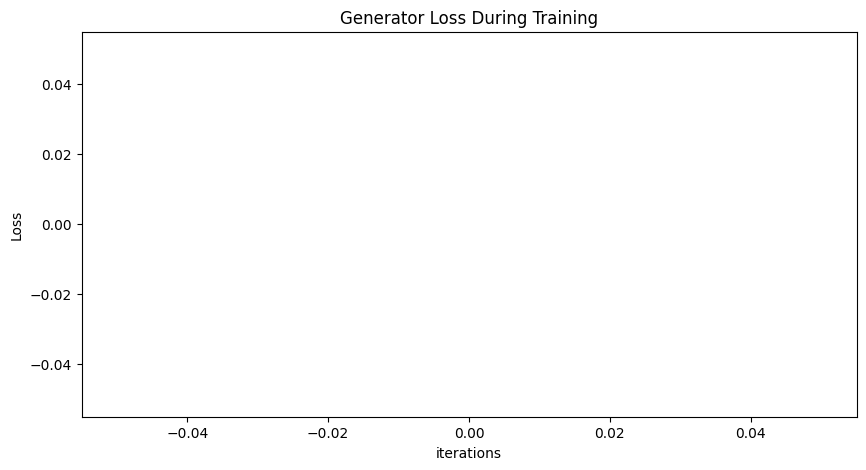

<Figure size 640x480 with 0 Axes>

In [127]:
# generator loss plot
plt.figure(figsize=(10,5))
plt.title("Generator Loss During Training")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

plt.savefig(os.path.join(output_save_path, 'output_generatorLoss_{}.png'.format(date)))

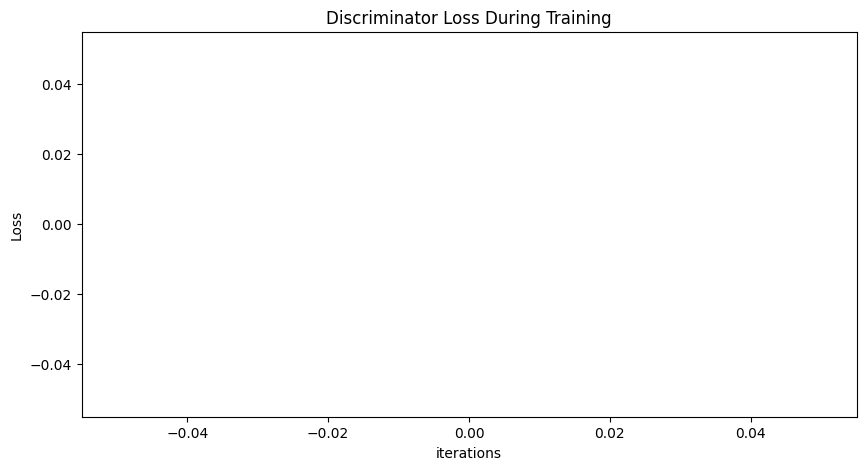

<Figure size 640x480 with 0 Axes>

In [125]:
# discriminator loss plot
plt.figure(figsize=(10,5))
plt.title("Discriminator Loss During Training")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

plt.savefig(os.path.join(output_save_path, 'output_discriminatorLoss_{}.png'.format(date)))

## Visualize output

In [27]:
import os
# Get all file names from the "generated_images" directory
output_save_path=r'C:\Users\Rowida\Desktop\graduation project\models\text-to-image-using-GAN\text-to-image-using-GAN\generator_epoch_250.pth'
file_names = os.listdir(output_save_path)
file_names = [name for name in file_names if name.startswith('output_{}_'.format(date))]

# Sort the file names numerically
file_names = sorted(file_names, key=lambda name: int(name.split('_')[3].split('.')[0]))

# Create a list to store the read images
images = []

for file_name in file_names:
    images.append(imageio.imread(os.path.join(output_save_path,file_name)))

imageio.mimsave(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)), images, fps=1) 


NameError: name 'file_names' is not defined

In [ ]:
from IPython.display import Image

# Load the GIF
with open(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)),'rb') as file:
    display(Image(file.read()))

In [186]:
# Get all file names from the "generated_images" directory
file_names = os.listdir(output_save_path)
file_names = [name for name in file_names if name.startswith('output_{}_'.format(date))]

# Sort the file names numerically
file_names = sorted(file_names, key=lambda name: int(name.split('_')[3].split('.')[0]))

# Create a list to store the read images
images = []

for file_name in file_names:
    images.append(imageio.imread(os.path.join(output_save_path,file_name)))

imageio.mimsave(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)), images, fps=1) 
from IPython.display import Image

# Load the GIF
with open(os.path.join(output_save_path, 'output_gif_{}.gif'.format(date)),'rb') as file:
    display(Image(file.read()))

ValueError: need at least one array to stack